In [1]:
%load_ext autoreload
%autoreload 2
import seaborn as sns
# sns.set_theme(style="darkgrid")
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)

### DATA


In [7]:
import random
import numpy as np
import torch.nn.functional as F
import torch
import torchvision.models as models
import torch.nn as nn
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from tqdm import tqdm
import matplotlib.pyplot as plt

from cv_exp import gradient, pipe, cam, eval, others
from cv_exp.utils import plotting_utils, data_utils

# import cv_exp
# import cv_exp.gradient as gradient
# import cv_exp.eval as eval
from cases.imagenet_exp import ImageNetSeg

pipe = pipe.Pipe()
imagenet_mini = ImageNetSeg()
val_dataset = imagenet_mini.val_dataset
val_seg_dataset = imagenet_mini.val_seg_dataset
classes_map = imagenet_mini.classes_map
class_label = imagenet_mini.class_label

device = pipe.device
resnet = models.resnet50(
    weights=models.ResNet50_Weights.IMAGENET1K_V1, progress=True
).to(device)
rand_resnet = models.resnet50(weights=None).to(device)
resnet = resnet.eval()
print(len(val_dataset))

Using device:  mps
seg sal not exist
3976


### Model


In [8]:
val_data_loader = torch.utils.data.DataLoader(
    val_dataset, batch_size=4, shuffle=False, num_workers=2
)

In [9]:
inputs, classes = next(iter(val_data_loader))
print(classes)
torch.cuda.empty_cache()
o = resnet(torch.rot90(inputs, dims=(2, 3)).to(device))
print(torch.argmax(o, dim=1))
print(np.array([o[i][classes[i]].item() for i in range(o.shape[0])]))
o = F.softmax(o, dim=1)
print(np.array([o[i][classes[i]].item() for i in range(o.shape[0])]))


o = resnet(inputs.to(device))
print(np.array([o[i][classes[i]].item() for i in range(o.shape[0])]))
o = F.softmax(o, dim=1)
print(np.array([o[i][classes[i]].item() for i in range(o.shape[0])]))

tensor([0, 0, 0, 0])
tensor([0, 0, 0, 0], device='mps:0')
[15.63304996 10.46920395 16.11336327  6.36490345]
[0.98753941 0.79195178 0.99801409 0.08678865]
[16.69101906 14.44139957 17.15411949 14.10000229]
[0.99184787 0.99475986 0.99963319 0.97847486]


### Saliency Map


In [10]:
ran_idx = []

[3454]


Proposed Evaluation:   0%|          | 0/2 [00:00<?, ?it/s]

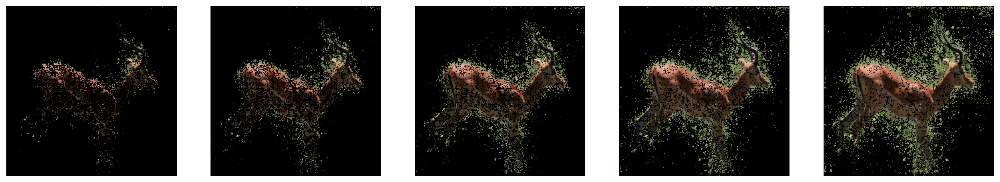

Recovered Images:  0.06037377 0.15130307

3-- hit_rate = local_heat_sum / overall_heat_sum
[[0.2486066  0.39394778 0.5025377  0.58857065 0.6587276 ]]

4-- removed pred prob
[[0.00009613 0.00489405 0.03643396 0.14537884 0.24374147]] [0.08610889]

6-- rs
local_heat_mean * hit_rate * recovered_pred_prob [0.00837032]
hit_rate * recovered_pred_prob [0.05327725]
hit_rate + recovered_pred_prob [0.56458694]


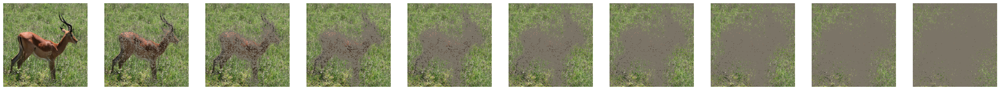

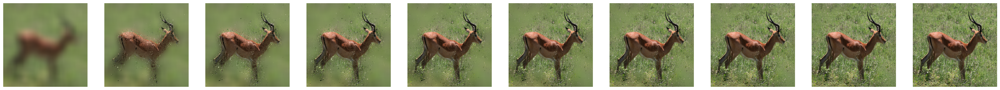

D Prob: [[0.95898455 0.04623006 0.00616996 0.00433944 0.00206083 0.00201067
  0.00229445 0.001395   0.00274373 0.00048386]]
I Prob: [[0.00089812 0.33376396 0.89457303 0.97600424 0.9714386  0.9740865
  0.9796667  0.9652587  0.97041196 0.96407694]]


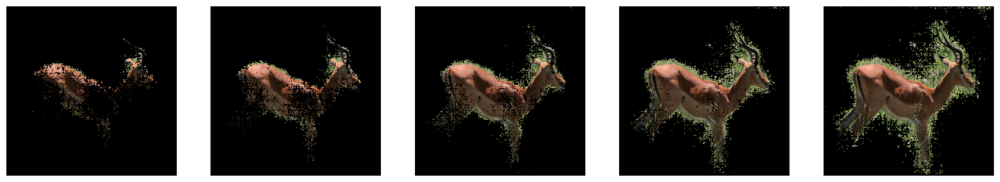

Recovered Images:  0.057389203 0.14621282

3-- hit_rate = local_heat_sum / overall_heat_sum
[[0.34402898 0.59406126 0.7965555  0.9363902  0.99829435]]

4-- removed pred prob
[[0.00057446 0.01534598 0.14420158 0.62242126 0.83075273]] [0.3226592]

6-- rs
local_heat_mean * hit_rate * recovered_pred_prob [0.08986048]
hit_rate * recovered_pred_prob [0.3072687]
hit_rate + recovered_pred_prob [1.0565252]


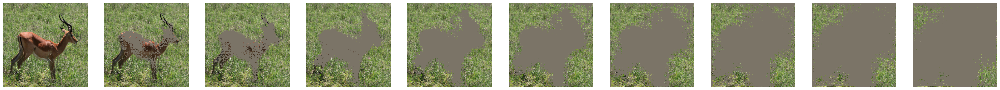

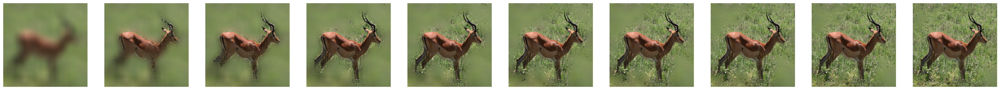

D Prob: [[0.95898455 0.16170761 0.03340891 0.00265108 0.00182122 0.00124685
  0.00066521 0.00450145 0.00781057 0.00582458]]
I Prob: [[0.00089812 0.7567004  0.947543   0.9790203  0.98018324 0.97989273
  0.97675145 0.9718257  0.9697156  0.9672053 ]]


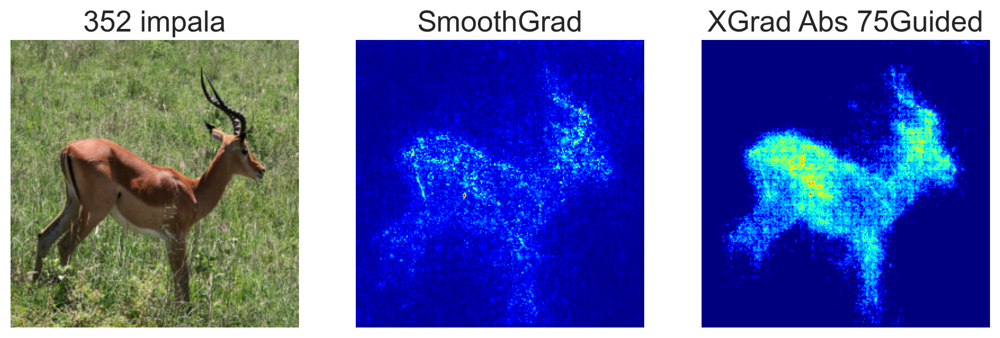

[(1, 'SmoothGrad'), (2, 'XGrad Abs 75Guided')]


MAE,Log-Cosh Dice Loss,RCAP2,DAUC,IAUC,Name
0.454789,0.274336,0.053277,0.054698,0.754769,SmoothGrad
0.397141,0.151182,0.307269,0.069622,0.804568,XGrad Abs 75Guided


In [12]:
import json

n = 10  # @param {type:"number"}
# n =  10 #@param {type:"number"}
keep = "no"  # @param ["yes", "no"]
# keep = "yes" #@param ["yes", "no"]
# specified = f"[{','.join([str(i) for i in range(s, s + d)])}]" #@param {type:"string"}
# s += d
specified = ""  # @param {type:"string"}
# specified = "[3307]" #@param {type:"string"}
# specified = "[3454]" #@param {type:"string"}
# specified = "[2101]" #@param {type:"string"}
# specified = "[2674]" #@param {type:"string"}
# specified = "[3958]" #@param {type:"string"}
# specified = "[983, 2198, 3454]" #@param {type:"string"}
# specified = "[2198]" #@param {type:"string"}
# specified = "[2443]" #@param {type:"string"}
specified = "[3454]"  # @param {type:"string"}
# specified = "[983]" #@param {type:"string"}
# specified = "[0]" #@param {type:"string"}
# specified = "[355]" #@param {type:"string"}
# specified = "[829]" #@param {type:"string"}
# specified = "[625, 3822]" #@param {type:"string"}
# specified = "[3126]"  # @param {type:"string"}
# specified = "[1341]" #@param {type:"string"}
# specified = "[2883]" #@param {type:"string"}
# specified = "[1943]" #@param {type:"string"}
# specified = "[0, 1]" #@param {type:"string"}
# specified = "[2601, 530]" #@param {type:"string"}
# specified = "[530]" #@param {type:"string"}
# specified = "[2601]" #@param {type:"string"}
# specified = "[25, 26, 27, 28]" #@param {type:"string"}
num_samples = 15  # @param {type:"number"}
std_spread = 0.15  # @param {type:"number"}
th = 0.4  # @param {type:"number"}

if len(ran_idx) == 0 or keep == "no":
    idxs = [i for i in range(len(val_dataset))]
    random.seed(None)
    random.shuffle(idxs)
    ran_idx = idxs[:n]

if specified != "":
    ran_idx = json.loads(specified)
    n = len(ran_idx)

print(ran_idx)

settings = {
    # 'Vanilla': [gradient.vanilla_gradient, {}],
    # f'GuidedBP 1': [gradient.guided_back_propagation, {
    # }, False, True],
    # f'GuidedBP MP': [gradient.misplaced_gb, {
    #     'remainprecentage': 0.1,
    #     'mispercentage': 0.15
    # }, False, True],
    # f'Neg GuidedBP 1': [gradient.guided_back_propagation, {
    #     'direction': 'negative'
    # }, False, True],
    # f'Both GuidedBP 1': [gradient.guided_back_propagation, {
    #     'direction': 'both'
    # }, False, True],
    # f'Abs GuidedBP 1': [gradient.guided_back_propagation, {
    #     'direction': 'abs'
    # }, False, True],
    # f'Abs GuidedBP 2': [gradient.guided_back_propagation, {
    #     'ifabs': True
    # }, False, True],
    # # 'CaptumIntGrad': [gradient.captum_integrated_gradients, {
    # #     'steps': 20,
    # # }, False, True],
    # 'IntGrad': [gradient.integrated_gradients, {
    #     'steps': 10,
    #     'trials': 3,
    # }, False, True],
    # 'Var IntGrad': [gradient.integrated_gradients, {
    #     'steps': 5,
    #     'trials': 2,
    #     'aggregation': 'var'
    # }, False, True],
    # 'IntGrad - M': [gradient.integrated_gradients, {
    #     'aggregation': 'mean'
    # }, False, True],
    # 'IntGrad+': [gradient.integrated_gradients, {
    #     'direction': 'positive'
    # }, False, True],
    # 'IntGrad-': [gradient.integrated_gradients, {
    #     'direction': 'negative'
    # }, False, True],
    # 'Abs IntGrad': [gradient.integrated_gradients, {
    #     'ifabs': True,
    # }, False, True],
    # 'Guided IntGrad': [gradient.integrated_gradients, {
    #     'aggregation': 'guided',
    #     'th': 0.75,
    # }, False, True],
    # 'Abs Guided IntGrad': [gradient.integrated_gradients, {
    #     'aggregation': 'guided',
    #     'th': 0.85,
    #     'ifabs': True,
    #     'steps': 5,
    #     'trials': 2,
    # }, False, True],
    # 'IDGI IntGrad': [gradient.integrated_gradients, {
    #     'idgi': True,
    #     'steps': 5,
    #     'trials': 2,
    # }, False, True],
    # 'GuidedIG': [gradient.guided_ig, {
    #     'num_samples': num_samples,
    # }, False, True],
    # 'IDGI GuidedIG': [gradient.guided_ig, {
    #     'num_samples': num_samples,
    #     'idgi': True
    # }, False, True],
    # 'Var GuidedIG': [gradient.guided_ig, {
    #     'num_samples': num_samples,
    #     'aggregation': 'var'
    # }, False, True],
    # 'G GuidedIG': [gradient.guided_ig, {
    #     'num_samples': num_samples,
    #     'aggregation': 'guided',
    #     'th': 0.75
    # }, False, True],
    # 'Abs G GuidedIG': [gradient.guided_ig, {
    #     'num_samples': num_samples,
    #     'aggregation': 'guided',
    #     'th': 0.75,
    #     'ifabs': True
    # }, False, True],
    # 'GuidedIG MP': [gradient.misplaced_guided_ig, {
    #     'num_samples': num_samples,
    #     'remainprecentage': 0.07,
    #     'mispercentage': 0.1
    #     # 'debug': True
    # }, False, True],
    # 'GuidedIG x 10': [gradient.guided_ig, {
    #     'num_samples': 50,
    #     # 'debug': True
    # }, False, True],
    # 'GuidedIG+': [gradient.guided_ig, {
    #     'num_samples': num_samples,
    #     'direction': 'positive'
    # }, False, True],
    # 'GuidedIG-': [gradient.guided_ig, {
    #     'num_samples': num_samples,
    #     'direction': 'negative'
    # }, False, True],
    # 'Abs GuidedIG': [gradient.guided_ig, {
    #     'num_samples': num_samples,
    #     'ifabs': True
    # }, False, True],
    # 'Proposed  GuidedIG': [gradient.guided_ig, {
    #     'num_samples': num_samples,
    #     'ifabs': True
    # }, False, True],
    # '30 BlurIG 20r': [gradient.blur_ig, {
    # }, False, True],
    # 'Var 30 BlurIG 20r': [gradient.blur_ig, {
    #     'aggregation': 'var'
    # }, False, True],
    # '30 BlurIG 20r MP': [gradient.misplaced_blurIg, {
    #     'remainprecentage': 0.1,
    #     'mispercentage': 0.15
    # }, False, True],
    # '30 BlurIG 20r Guided': [gradient.blur_ig, {
    #     'aggregation': 'guided',
    #     'th': 0.75
    # }, False, True],
    # '30 BlurIG 20r Abs Guided': [gradient.blur_ig, {
    #     'ifabs': True,
    #     'aggregation': 'guided',
    #     'th': 0.75
    # }, False, True],
    # 'Abs BlurIG': [gradient.blur_ig, {
    #     'ifabs': True,
    # }, False, True],
    # 'BlurIG+': [gradient.blur_ig, {
    #     'direction': 'positive',
    # }, False, True],
    # 'BlurIG-': [gradient.blur_ig, {
    #     'direction': 'negative',
    # }, False, True],
    "SmoothGrad": [
        gradient.smooth_grad,
        {
            "num_samples": num_samples,
            "std_spread": std_spread,
        },
        False,
        True,
    ],
    # 'SmoothGrad-SQ': [gradient.smooth_grad, {
    #     'num_samples': num_samples,
    #     'std_spread': std_spread,
    #     'ifsquare': True
    # }, False, True],
    # 'SmoothGrad_MP': [gradient.misplaced_smooth_grad, {
    #     'num_samples': num_samples,
    #     'std_spread': std_spread,
    #     'remainprecentage': 0.1,
    #     'mispercentage': 0.15
    # }, False, True],
    # 'PosSmoothGrad': [gradient.one_direction_smooth_grad, {
    #     'num_samples': num_samples,
    #     'std_spread': std_spread,
    #     'positive_only': True
    # }, False, True],
    # 'NegSmoothGrad': [gradient.one_direction_smooth_grad, {
    #     'num_samples': num_samples,
    #     'std_spread': std_spread,
    #     'positive_only': False
    # }, False, True],
    # 'vargrad': [gradient.var_grad, {
    #     'num_samples': num_samples,
    #     'std_spread': std_spread,
    # }, False, True],
    # 'XGrad NoAbs 75Guided': [gradient.guided_absolute_grad, {
    #     'num_samples': num_samples,
    #     'ifabs': False,
    #     'th': 0.75
    # }, False, True],
    # 'XGrad Abs NoGuide 0 ': [gradient.guided_absolute_grad, {
    #     'num_samples': num_samples,
    #     'aggregation': 'mean',
    # }, False, True],
    # 'XGrad Abs NoGuide': [gradient.guided_absolute_grad, {
    #     'num_samples': num_samples,
    # }, False, True],
    "XGrad Abs 75Guided": [
        gradient.guided_absolute_grad,
        {
            "num_samples": num_samples,
            "th": 0.75,
        },
        False,
        True,
    ],
    # 'XGrad NoAbs 85Guided': [gradient.guided_absolute_grad, {
    #     'num_samples': num_samples,
    #     'th': 0.85,
    #     'ifabs': False,
    # }, False, True],
    # 'XGrad Abs VarGuided': [gradient.guided_absolute_grad, {
    #     'num_samples': num_samples,
    #     'th': -1
    # }, False, True],
    # 'XGrad Abs 75Guided-MP': [gradient.misplaced_guided_absolute_grad, {
    #     'num_samples': num_samples,
    #     'th': 0.75,
    #     'remainprecentage': 0,
    #     'mispercentage': 0.5
    # }, False, True],
    # 'GradCAM': [cam.grad_cam, {
    #     'target_layers': [resnet.layer4[-1]],
    #     # 'eigen_smooth': True
    # }, False, True],
    # 'RISE': [others.rise, {
    #     'num_masks': 1000,
    #     'probability': 0.3
    # }, False, True],
    # 'Seg': [others.segmentation_exp, {
    #     'seg_dataset': val_seg_dataset,
    #     'ids': ran_idx
    # }, False, True],
}

# for p in [0.95, 0.85,0.75,0.65,0.55, 0.45, 0.35, 0.25, 0.15, 0]:
#     settings[f'XGrad Guided {p}'] = [gradient.guided_absolute_grad, {
#         'num_samples': num_samples,
#         'aggregation': 'guided',
#         'th': p
#     }, False, True]

unary_rs = eval.evaluation_demo(
    resnet,
    val_dataset,
    val_seg_dataset,
    device,
    settings,
    ran_idx,
    classes_map,
    class_label,
    # random_seed=42,
    # if_sanity_check=True,
    if_auc_check=True,
    # stop=0.5, steps=0.1, ifquantus=False, debug=False)
    # stop=0.4, steps=0.1, ifquantus=True, debug=False)
    # stop=0.7, steps=0.0375, ifquantus=True, debug=False)
    stop=0.7,
    steps=0.06,
    ifquantus=False,
    debug=True,
)
# stop=0.2, steps=0.2, ifquantus=False, debug=False)
# stop=0.5, steps=0.1, ifquantus=False, debug=True)
aggregated_eval_rs_map = plotting_utils.plot_eval_rs(*unary_rs[-2:], sort_key="RCAP2")